In [106]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download -c house-prices-advanced-regression-techniques
!unzip house-prices-advanced-regression-techniques.zip

mkdir: cannot create directory ‘/root/.kaggle’: File exists
house-prices-advanced-regression-techniques.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  house-prices-advanced-regression-techniques.zip
replace data_description.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: data_description.txt    
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


##Necessary Imports

In [107]:
import numpy as np
import pandas as pd
from xgboost import XGBRegressor
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import AdaBoostRegressor
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,OrdinalEncoder
from sklearn.compose import ColumnTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import StandardScaler,OrdinalEncoder,FunctionTransformer

##Data Description

In [108]:
txt=open("data_description.txt")
print(txt.read())

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM

##Reading Data

In [109]:
df=pd.read_csv("train.csv")
df.drop("Id",axis=1,inplace=True)
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [110]:
len(df.columns)

80

##Exploratory Data Analysis

In [111]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [112]:
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [113]:
df.duplicated().sum()

0

Based on reading the above description of the data, features have been classified into three categories :

*   Numerical Features
*   Categorical Features
*   Year Features





In [114]:
target="SalePrice"
year_features=["YearBuilt","YearRemodAdd","GarageYrBlt","YrSold","MoSold"]
numerical_features=["LotFrontage","LotArea","MasVnrArea","BsmtFinSF1","BsmtFinSF2","BsmtUnfSF","TotalBsmtSF","1stFlrSF","2ndFlrSF","LowQualFinSF",\
                    "GrLivArea","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath","TotRmsAbvGrd",\
                    "Fireplaces","GarageCars","GarageArea","WoodDeckSF","OpenPorchSF","EnclosedPorch","3SsnPorch","ScreenPorch","PoolArea","MiscVal",\
                    "SalePrice","MSSubClass"]
categorical_features=["MSZoning","Street","Alley","LotShape","LandContour","Utilities","LotConfig","LandSlope","Neighborhood","Condition1",\
                      "Condition2","BldgType","HouseStyle","OverallQual","OverallCond","RoofStyle","Exterior1st","Exterior2nd","MasVnrType","ExterQual",\
                      "ExterCond","Foundation","BsmtQual","BsmtCond","BsmtExposure","BsmtFinType1","BsmtFinType2","Heating","HeatingQC","CentralAir","Electrical",\
                      "KitchenQual","Functional","FireplaceQu","GarageType","GarageFinish","GarageQual","GarageCond","PavedDrive","PoolQC","Fence","MiscFeature",\
                      "SaleType","SaleCondition","RoofMatl","BedroomAbvGr","KitchenAbvGr"]
print(f"Number of Numerical Columns: {len(numerical_features)}")
print(f"Number of Categorical Columns: {len(categorical_features)}")
print(f"Number of Year Features : {len(year_features)}")

Number of Numerical Columns: 28
Number of Categorical Columns: 47
Number of Year Features : 5


## Univariate Analysis

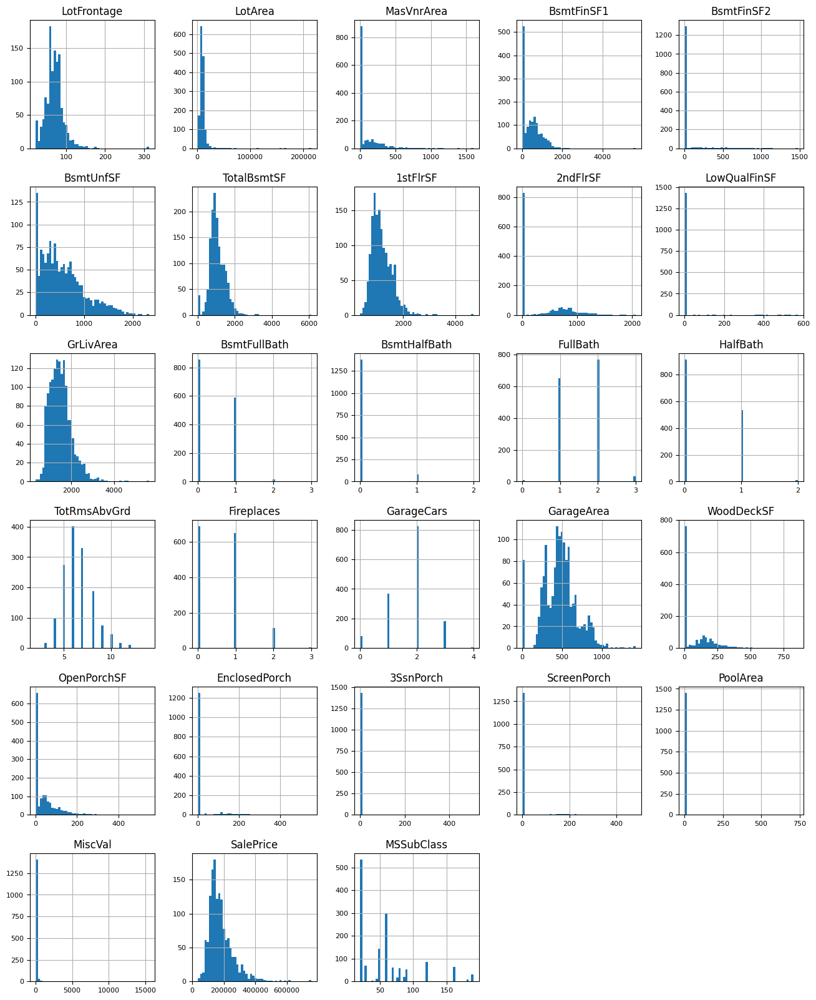

In [115]:
df[numerical_features].hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

Observations from the above graph:

We have total of 27 numerical features. Most of the numerical features are skewed. Some of the features like HalfBath, FullBath, BsmtHalfBath, BsmtFullBath  and some more eventhough have limited number of unique values based on the above data description it is considered as numerical features. More importantly, the target feature "SalePrice" is also skewed. All these skewed features will be rectified in feature transformation.





<ipython-input-116-93f0ef6a7e71>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(1,1,figsize=(10,5))


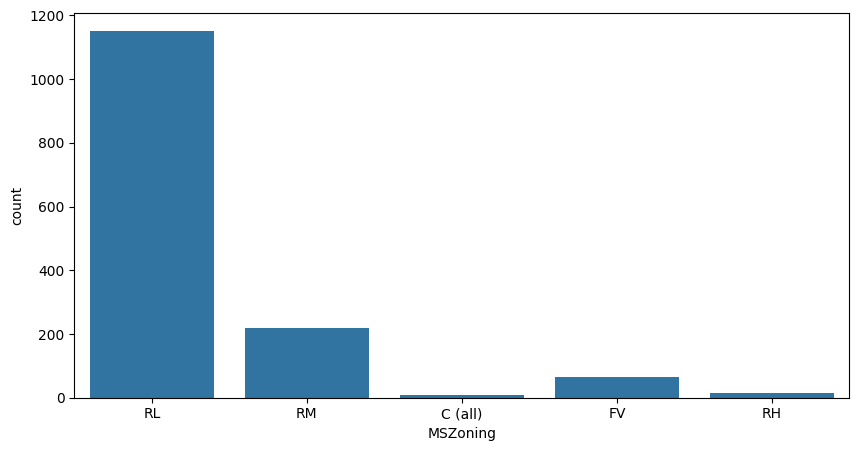

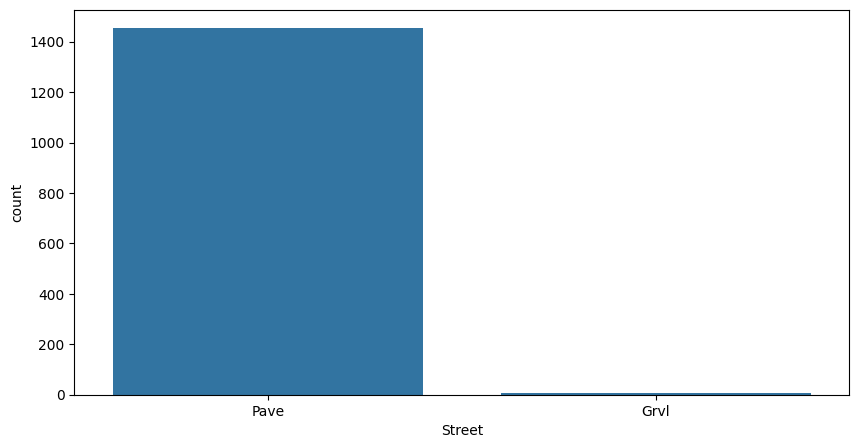

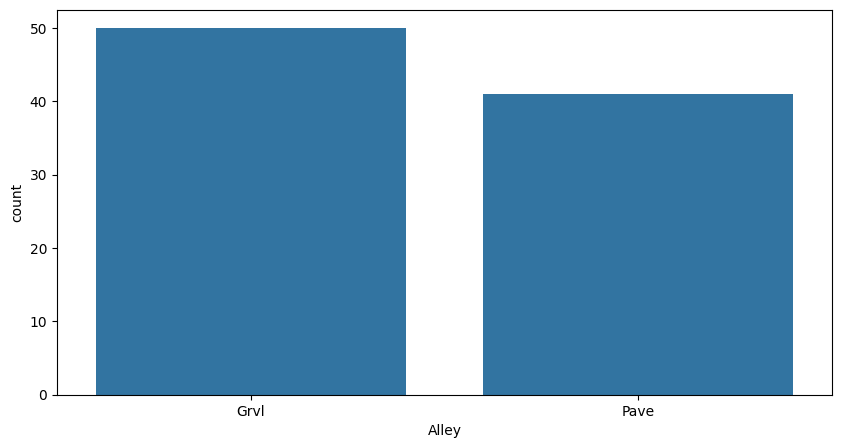

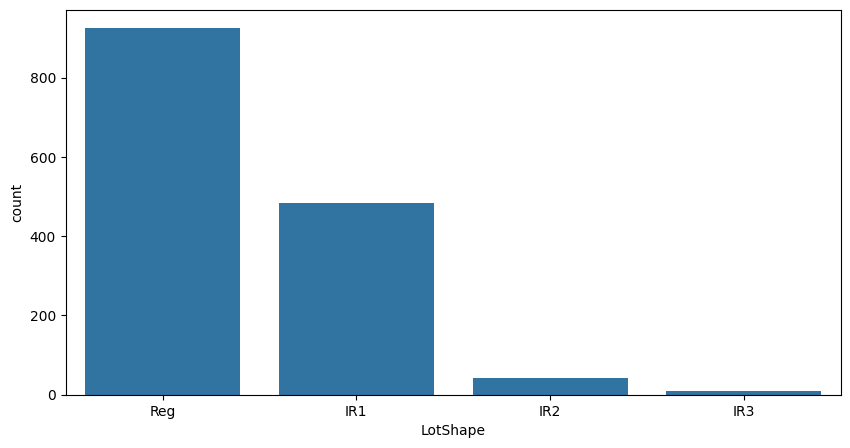

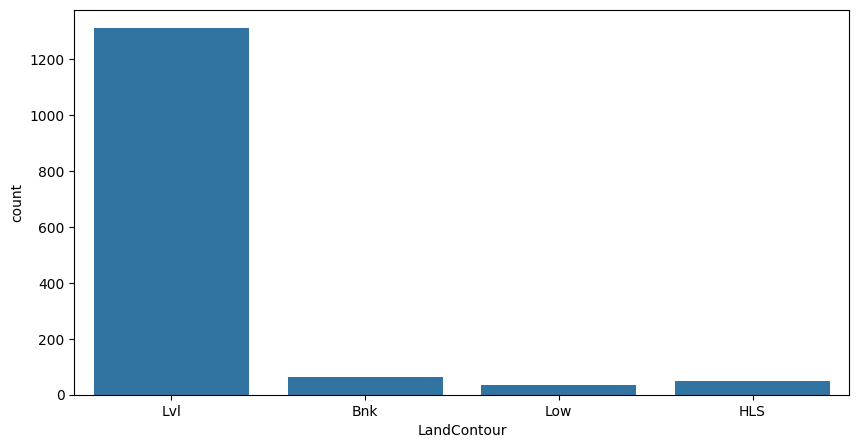

...

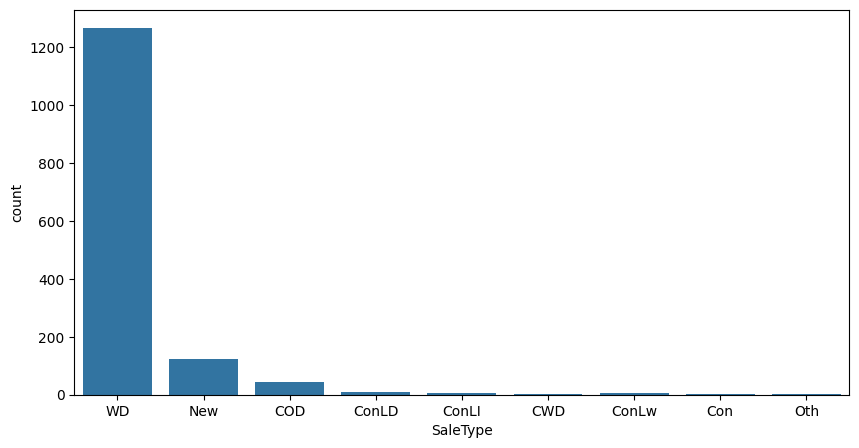

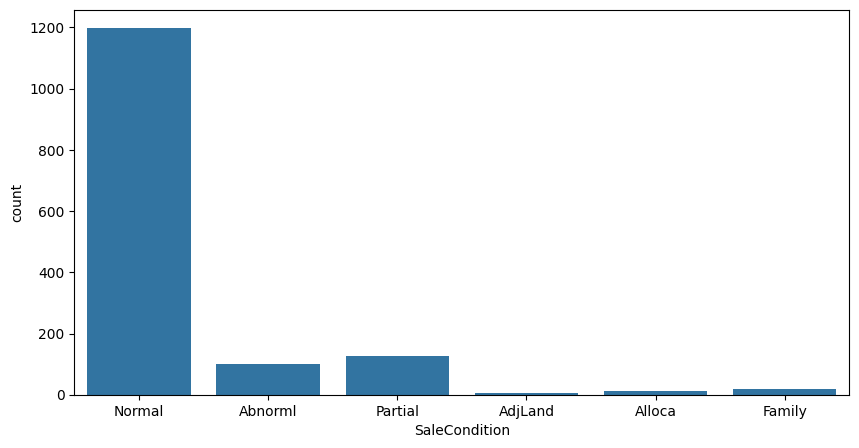

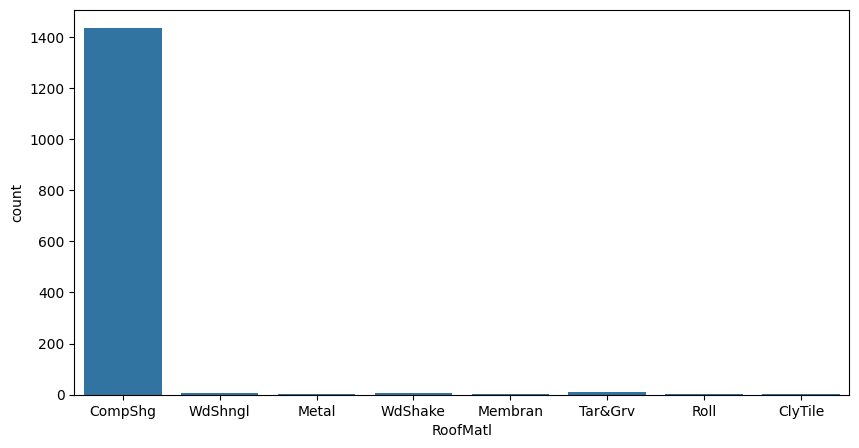

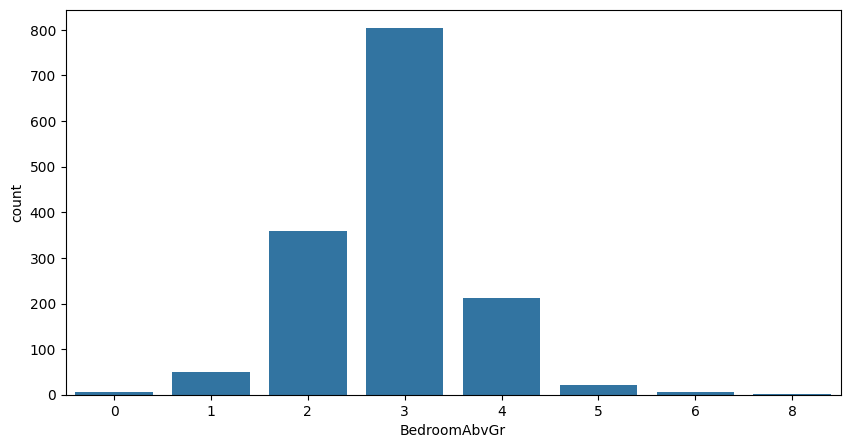

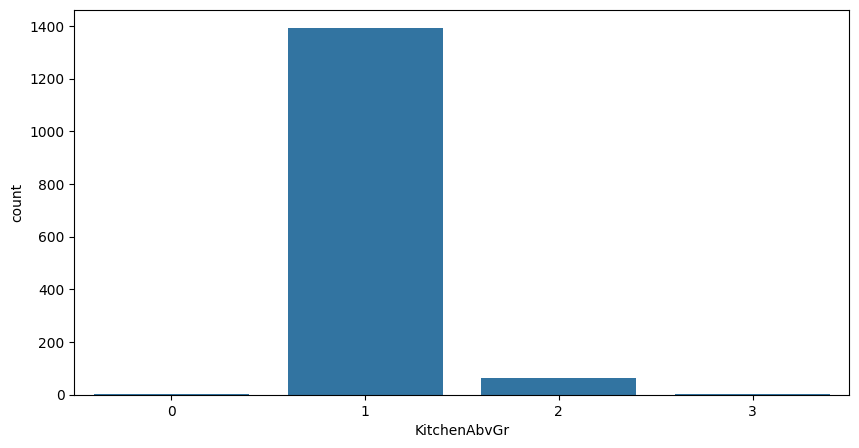

In [116]:
for feature in categorical_features:
    fig,ax=plt.subplots(1,1,figsize=(10,5))
    sns.countplot(x=feature,data=df,ax=ax)

Observations from the above graph:

We have 45 categorical features.One category is dominating in some of the categorical features.

## Bivariate Analysis

In [117]:
discrete_features=[feature for feature in numerical_features if len(df[feature].unique())<=25]
continuous_features=[feature for feature in numerical_features if len(df[feature].unique()) > 25]
print(f'We have {len(discrete_features)} discrete features')
print(f'We have {len(continuous_features)} continuous features')

We have 12 discrete features
We have 16 continuous features


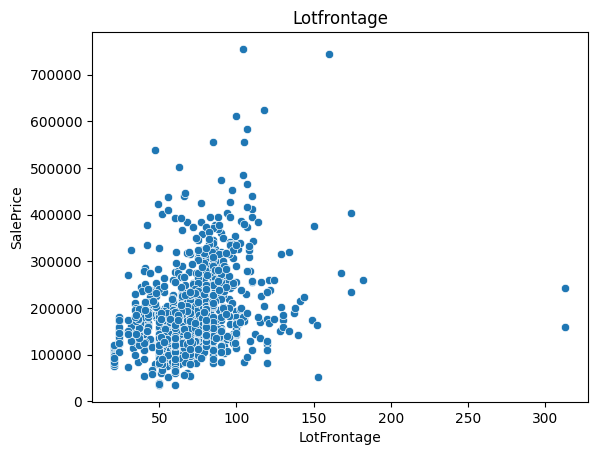

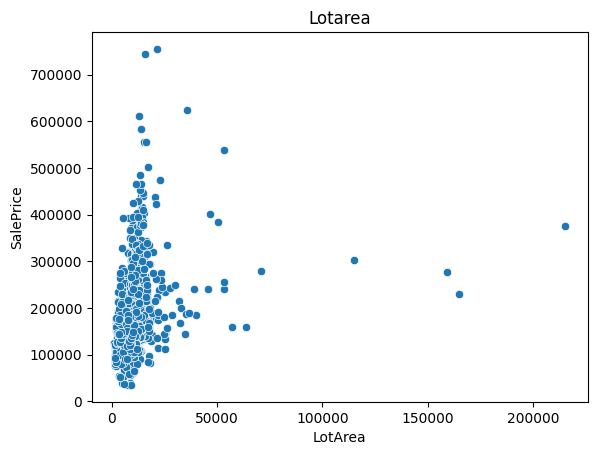

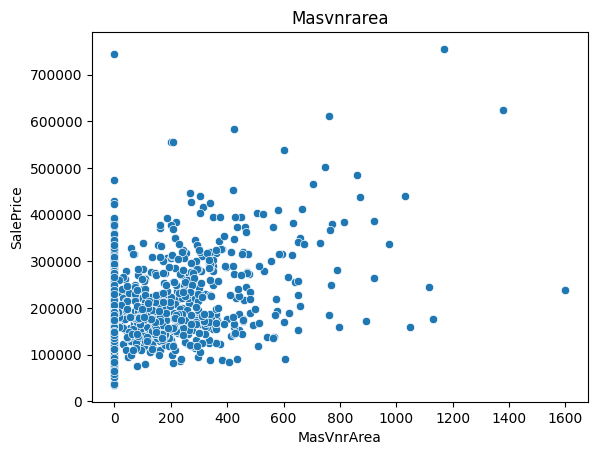

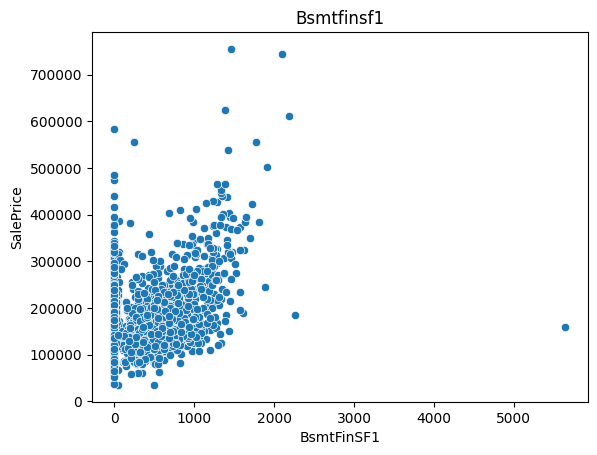

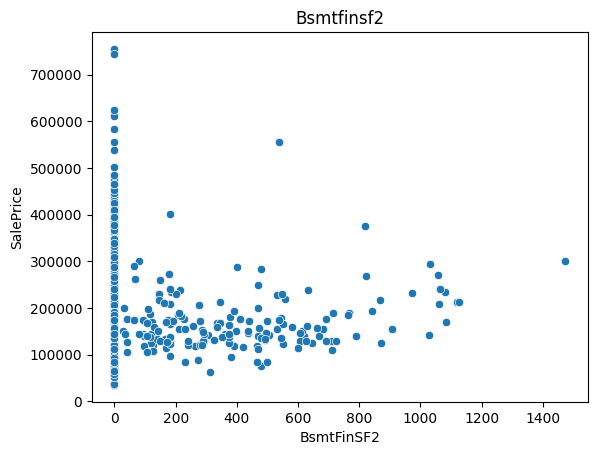

...

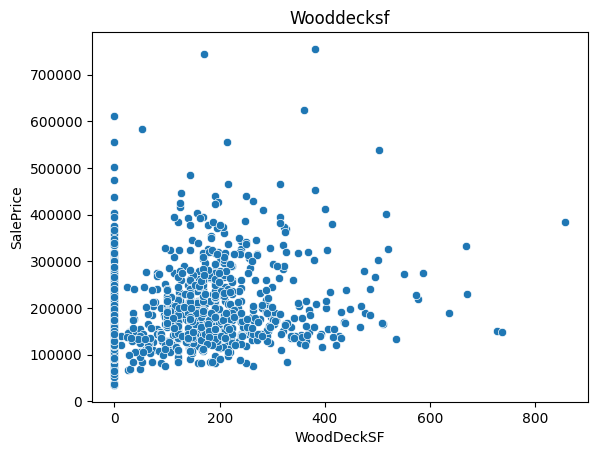

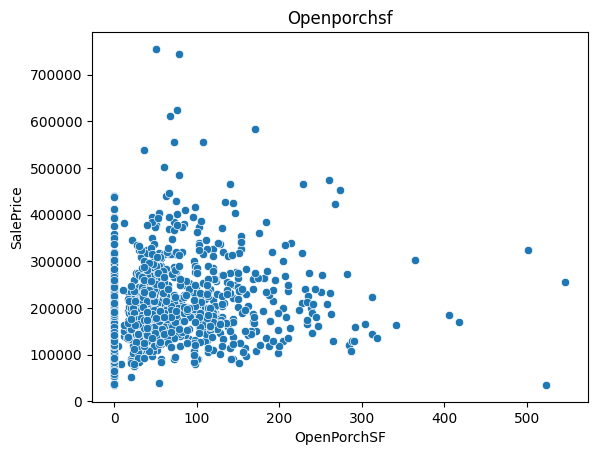

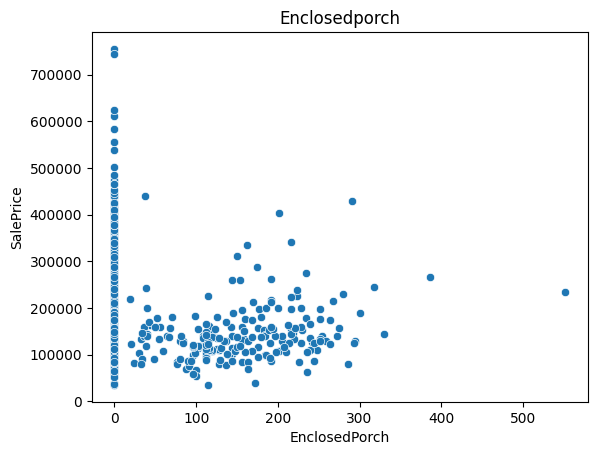

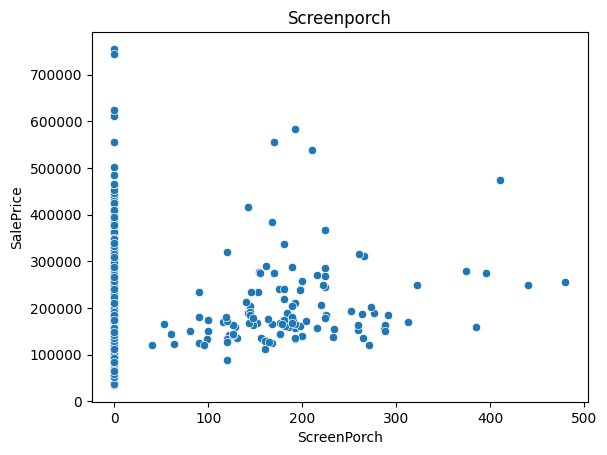

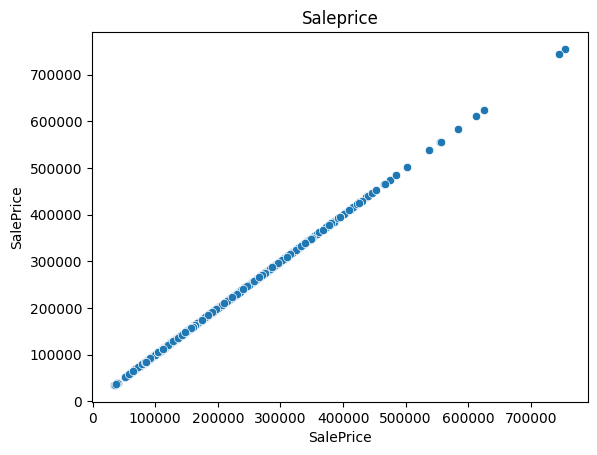

In [118]:
for feature in continuous_features:
    sns.scatterplot(data=df, x=feature, y=target)
    plt.xlabel(feature)
    plt.title(feature.title())
    plt.show()

Observation :

Based on the scatter plots above, Positive Correlation between target feature "SalePrice" and feature like LotFrontage, GrivLivArea, Totalbsmtsf, 1stFlrSF and 2ndFlrsf

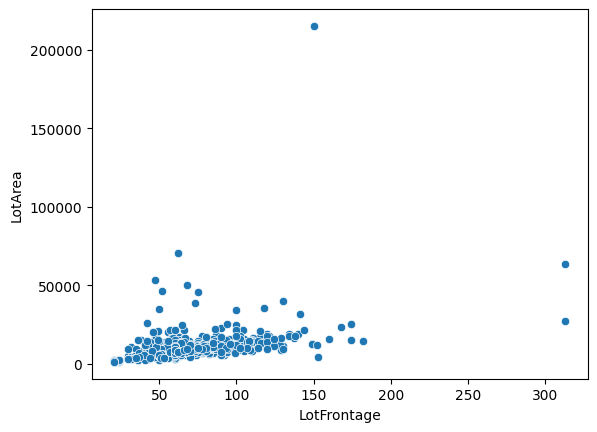

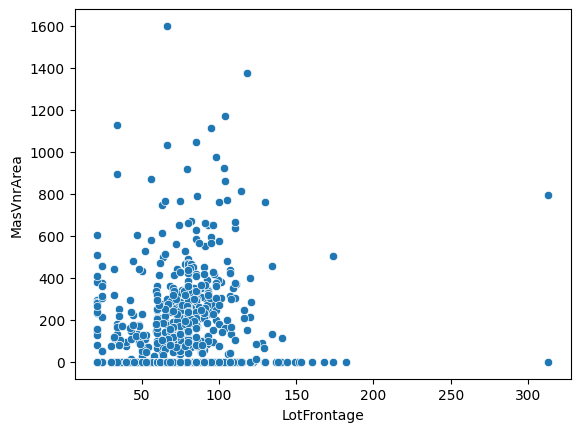

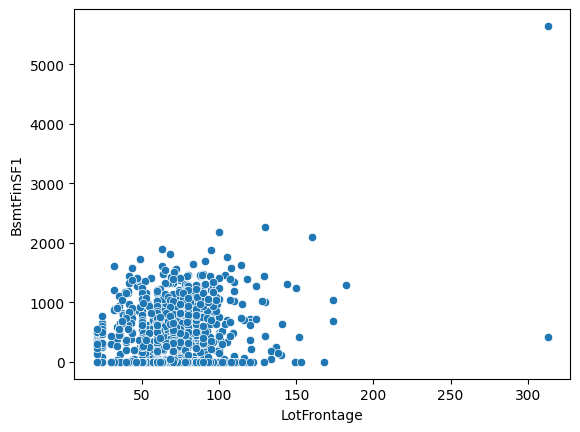

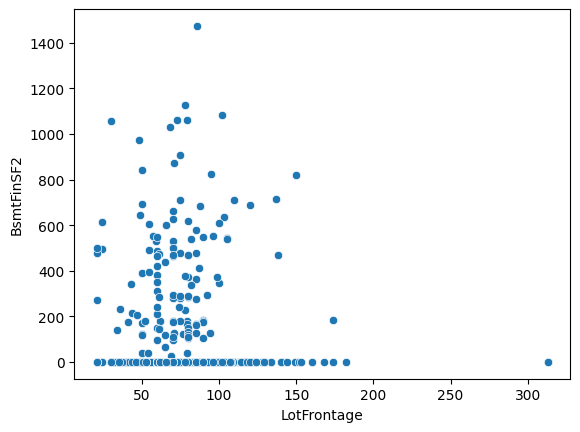

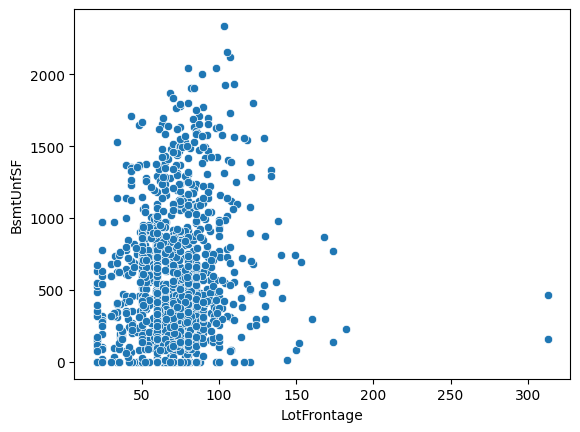

...

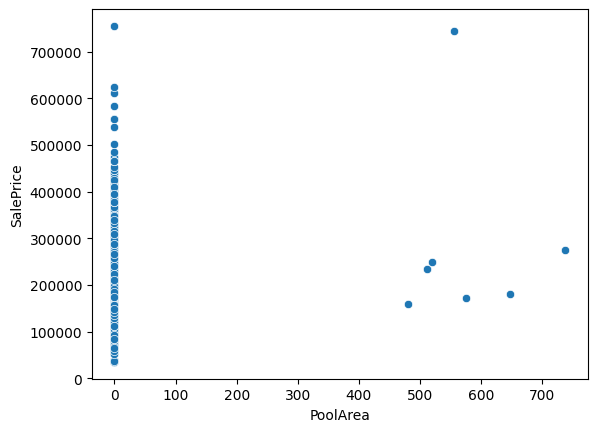

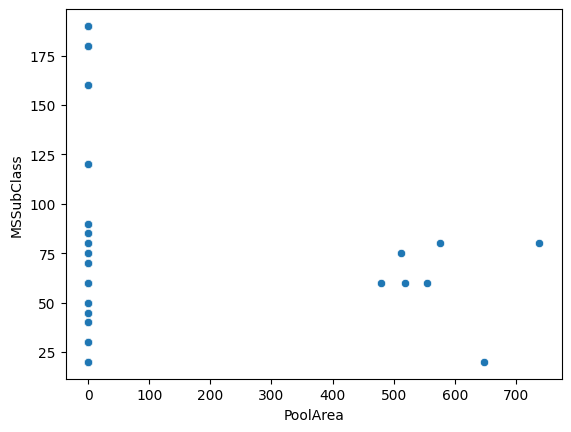

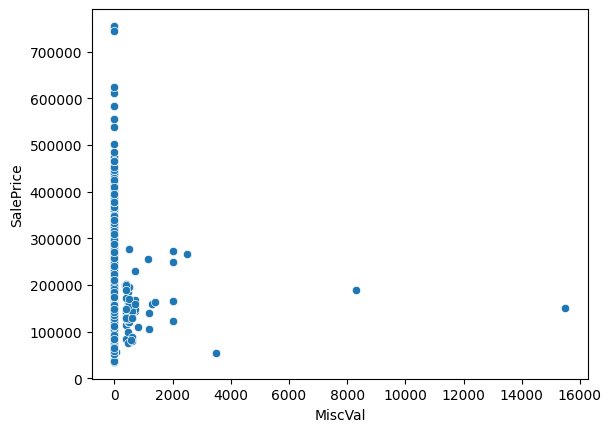

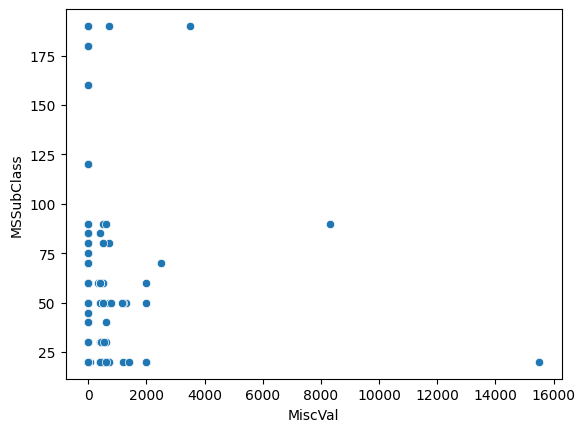

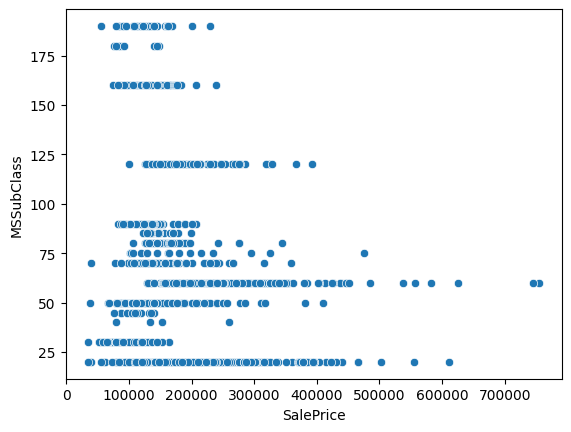

In [119]:
for i in range(len(numerical_features)):
  for j in range(len(numerical_features)):
    if i!=j and j>i:
      sns.scatterplot(data=df, x=numerical_features[i], y=numerical_features[j])
      plt.xlabel(numerical_features[i])
      plt.ylabel(numerical_features[j])
      plt.show()

<Axes: >

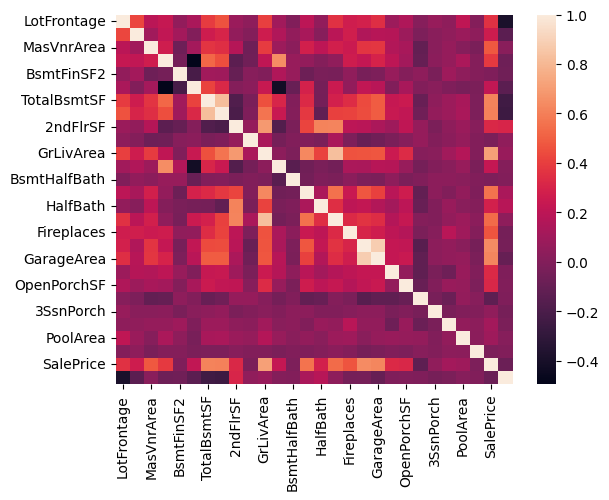

In [120]:
sns.heatmap(df[numerical_features].corr())

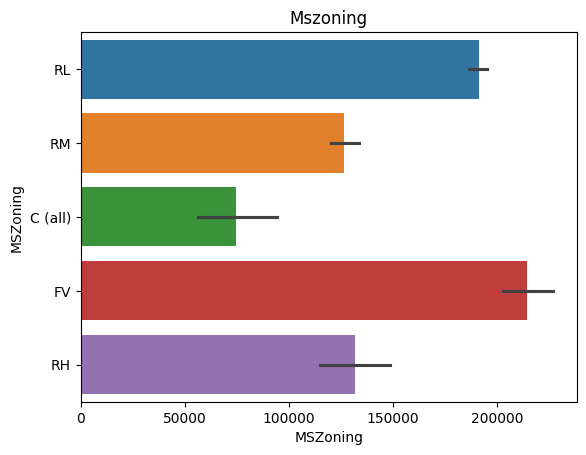

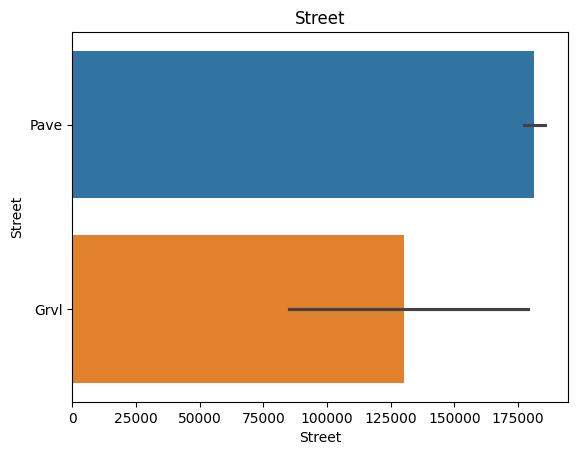

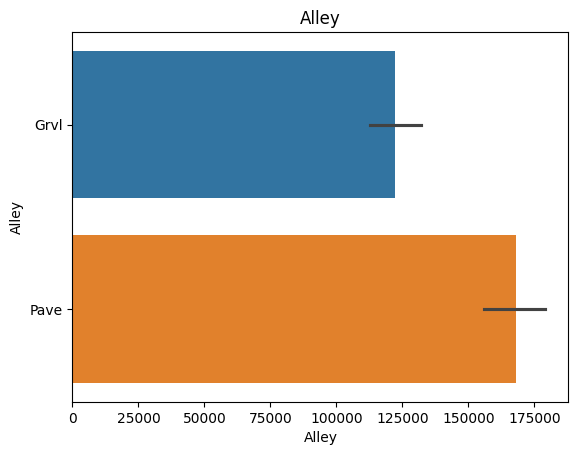

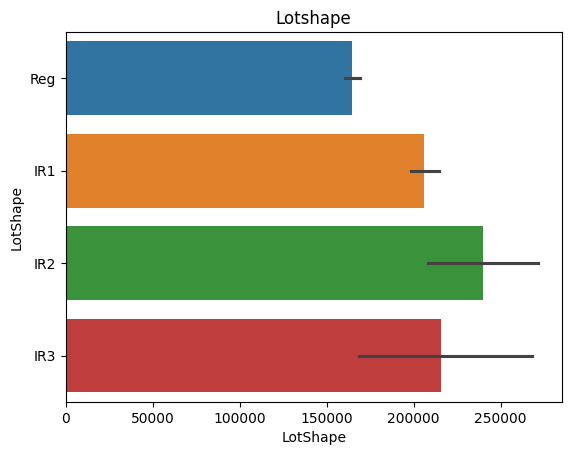

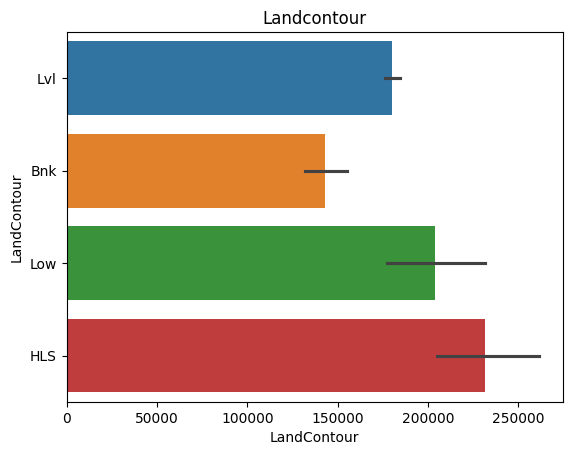

...

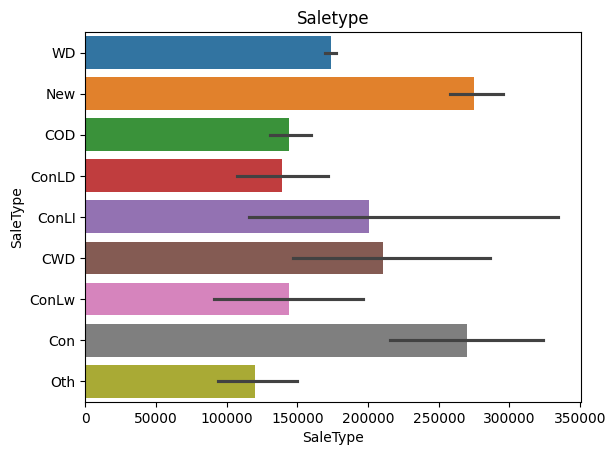

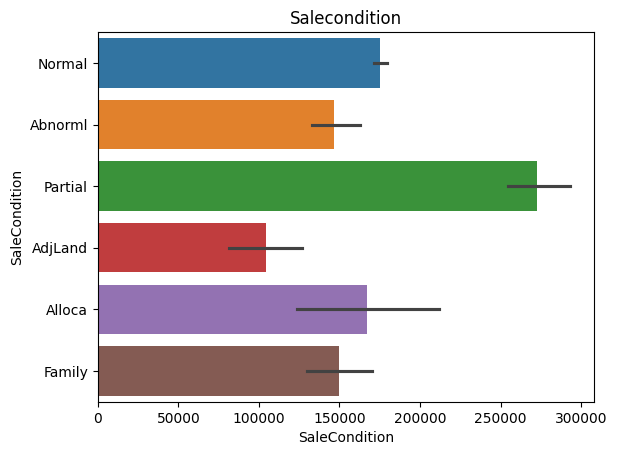

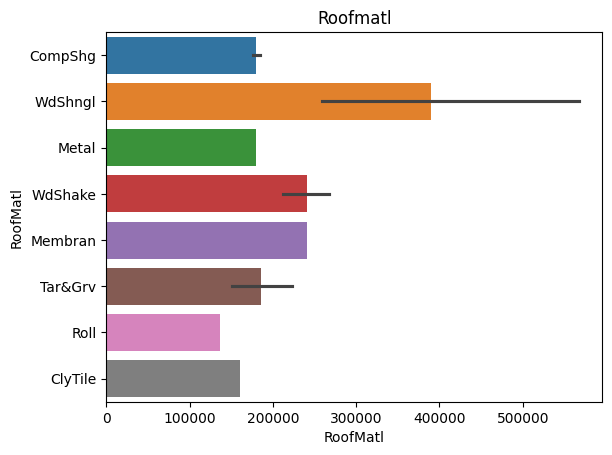

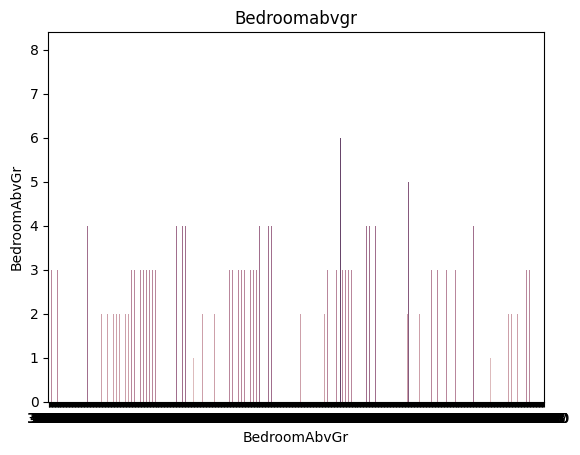

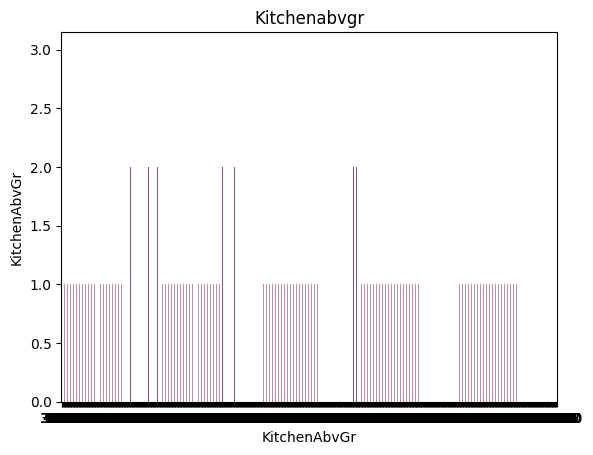

In [121]:
for feature in categorical_features:
  sns.barplot(df, x=target, y=feature, hue=feature, legend=False)
  plt.xlabel(feature)
  plt.title(feature.title())
  plt.show()

## Data Cleaning : Handling Missing Values

In [122]:
missing_values_columns=[feature for feature in df.columns if df[feature].isnull().sum()>0]
print(f"Number of Missing Columns : {len(missing_values_columns)}")

Number of Missing Columns : 19


In [123]:
missing_year_features=[]
missing_categorical_columns=[]
missing_numerical_columns=[]
for feature in missing_values_columns:
  if feature in year_features:
    missing_year_features.append(feature)
  elif feature in numerical_features:
    missing_numerical_columns.append(feature)
  else:
    missing_categorical_columns.append(feature)
print(f"Number of Missing year Features : {len(missing_year_features)}")
print(f"Number of Missing Numerical Columns : {len(missing_numerical_columns)}")
print(f"Number of Missing Categorical Columns : {len(missing_categorical_columns)}")

Number of Missing year Features : 1
Number of Missing Numerical Columns : 2
Number of Missing Categorical Columns : 16


In [124]:
for feature in missing_numerical_columns:
    print(f"Percentage of Missing values in {feature} : {(df[feature].isnull().sum()/len(df[feature]))*100}")

Percentage of Missing values in LotFrontage : 17.73972602739726
Percentage of Missing values in MasVnrArea : 0.547945205479452


In [125]:
for feature in missing_categorical_columns:
    print(f"Percentage of Missing values in {feature} : {(df[feature].isnull().sum()/len(df[feature]))*100}")

Percentage of Missing values in Alley : 93.76712328767123
Percentage of Missing values in MasVnrType : 59.726027397260275
Percentage of Missing values in BsmtQual : 2.5342465753424657
Percentage of Missing values in BsmtCond : 2.5342465753424657
Percentage of Missing values in BsmtExposure : 2.6027397260273974
Percentage of Missing values in BsmtFinType1 : 2.5342465753424657
Percentage of Missing values in BsmtFinType2 : 2.6027397260273974
Percentage of Missing values in Electrical : 0.0684931506849315
Percentage of Missing values in FireplaceQu : 47.26027397260274
Percentage of Missing values in GarageType : 5.5479452054794525
Percentage of Missing values in GarageFinish : 5.5479452054794525
Percentage of Missing values in GarageQual : 5.5479452054794525
Percentage of Missing values in GarageCond : 5.5479452054794525
Percentage of Missing values in PoolQC : 99.52054794520548
Percentage of Missing values in Fence : 80.75342465753424
Percentage of Missing values in MiscFeature : 96.3013

In [126]:
for feature in missing_year_features:
    print(f"Percentage of Missing values in {feature} : {(df[feature].isnull().sum()/len(df[feature]))*100}")

Percentage of Missing values in GarageYrBlt : 5.5479452054794525


In [127]:
for feature in missing_categorical_columns:
      df[feature]=df[feature].fillna("Missing")

In [128]:
for feature in missing_numerical_columns:
  df[feature]=df[feature].fillna(df[feature].median())

In [129]:
def impute_nan(df,variable):
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample
for feature in missing_year_features:
  impute_nan(df,feature)

In [130]:
sum(df.isnull().sum())

0

## Multi-Collinearity

In [131]:
numerical_features.remove(target)
X=df[numerical_features]
vif_data = pd.DataFrame()
vif_data["Feature"] =X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
multi_collinear_columns=list(vif_data[vif_data['VIF']>10].Feature)

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


In [132]:
vif_data

,Feature,VIF
0,LotFrontage,13.942475
1,LotArea,2.586104
2,MasVnrArea,1.740790
3,BsmtFinSF1,inf
4,BsmtFinSF2,inf
5,BsmtUnfSF,inf
6,TotalBsmtSF,inf
7,1stFlrSF,inf
8,2ndFlrSF,inf
9,LowQualFinSF,inf


In [133]:
print(multi_collinear_columns)

['LotFrontage', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea']


In [134]:
df.drop(multi_collinear_columns,inplace=True,axis=1)
df.shape

(1460, 67)

In [135]:
for feature in multi_collinear_columns:
  if feature in numerical_features:
    numerical_features.remove(feature)

## Outliers Handling

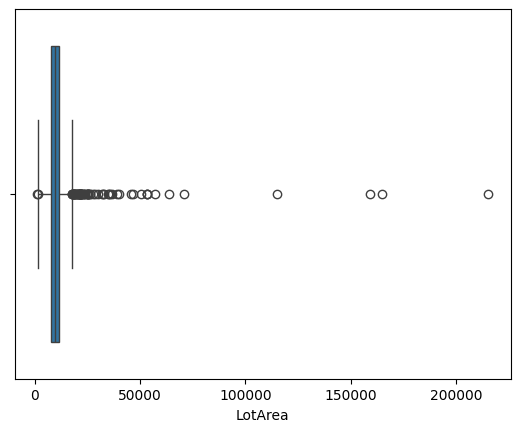

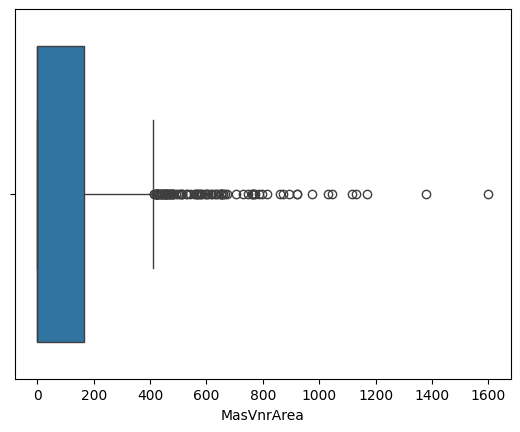

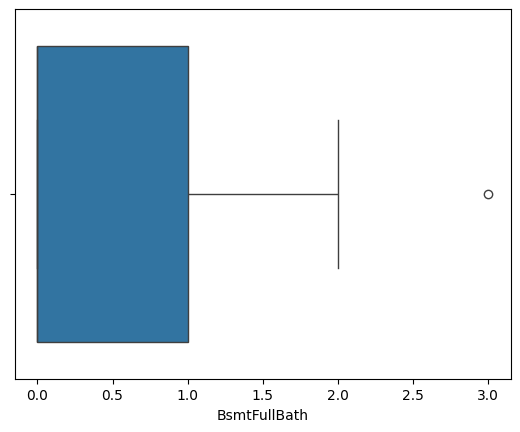

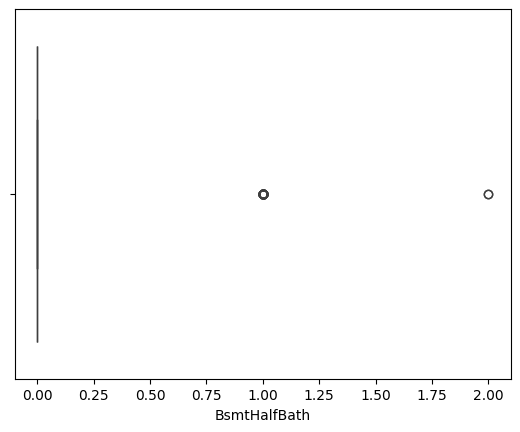

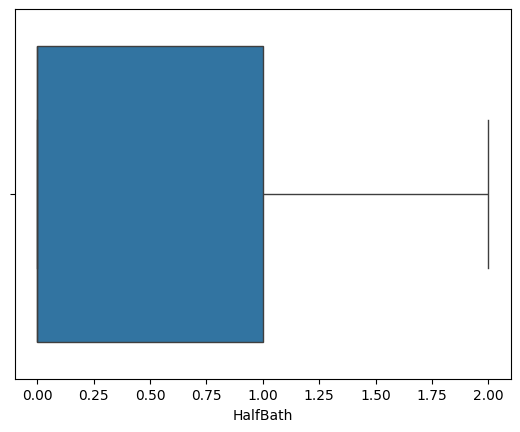

...

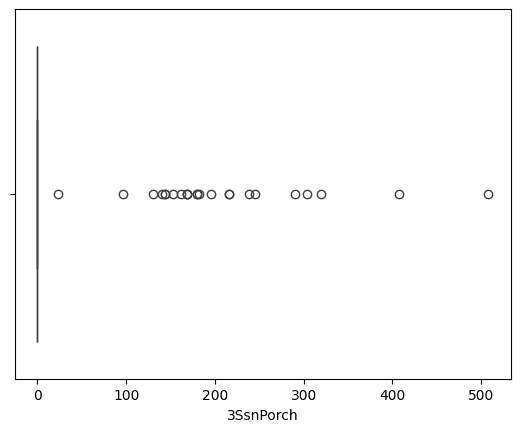

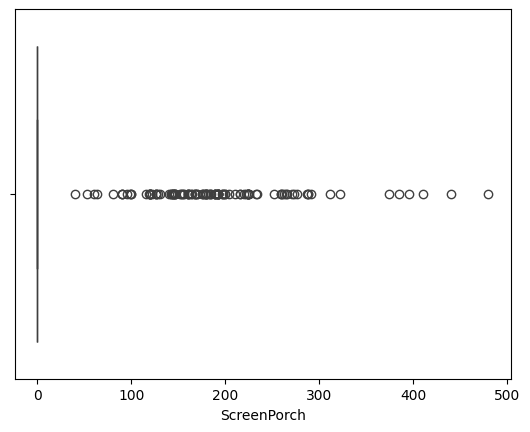

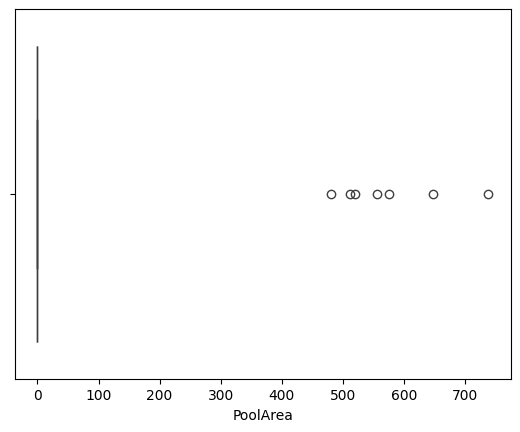

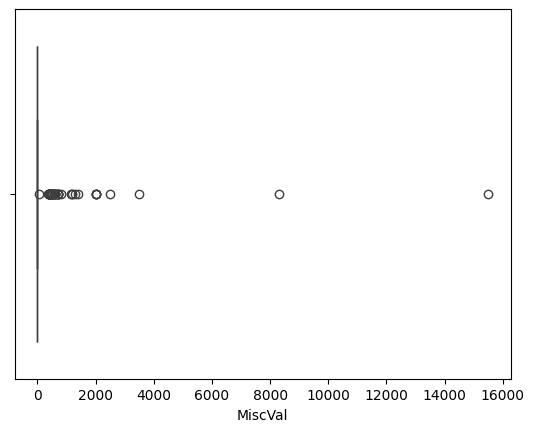

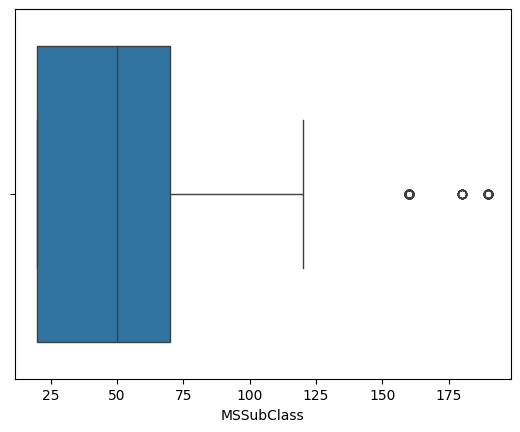

In [136]:
for feature in numerical_features:
    fig,ax=plt.subplots(1,1)
    sns.boxplot(data=df,x=feature,ax=ax)

Observations :

Features like EnclosedPorch, 3SsnPorch, ScreenPorch, MiscVal, WoodDeckSF, LotArea and MasVnrArea have many outliers. Based on obeservations, these outliers may be valid data points.

##Feature Engineering & Transformation

In [137]:
df["HouseAge"]=df["YrSold"]-df["YearBuilt"]

In [138]:
scaling_features=numerical_features.copy()
scaling_features.append(target)
skewness=df[scaling_features].skew(axis=0, skipna=True)
skew_df=pd.DataFrame(skewness,columns=["Skweness"])
skew_list=skew_df[skew_df["Skweness"]>0.75].index.tolist()
df[skew_list] = np.log1p(df[skew_list])

In [139]:
print(skew_list)

['LotArea', 'MasVnrArea', 'BsmtHalfBath', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MSSubClass', 'SalePrice']


In [140]:
ordinal_encoder = OrdinalEncoder()
df[categorical_features]=ordinal_encoder.fit_transform(df[categorical_features])
for feature in categorical_features:
  df[feature]=df[feature].astype(int)
df.head()

,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,HouseAge
0,4.110874,3,9.042040,1,1,3,3,0,4,0,...,3,2,1,0.0,2,2008,8,4,12.247699,5
1,3.044522,3,9.169623,1,1,3,3,0,2,0,...,3,2,1,0.0,5,2007,8,4,12.109016,31
2,4.110874,3,9.328212,1,1,0,3,0,4,0,...,3,2,1,0.0,9,2008,8,4,12.317171,7
3,4.262680,3,9.164401,1,1,0,3,0,0,0,...,3,2,1,0.0,2,2006,8,0,11.849405,91
4,4.110874,3,9.565284,1,1,0,3,0,2,0,...,3,2,1,0.0,12,2008,8,4,12.429220,8


In [141]:
X = df.drop([target], axis=1)
y = df[target]

In [142]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)
print("Training set - Features:", X_train.shape, "Labels:", y_train.shape)
print("Test set - Features:", X_test.shape, "Labels:", y_test.shape)

Training set - Features: (1168, 67) Labels: (1168,)
Test set - Features: (292, 67) Labels: (292,)


In [143]:
standard_scaler_features=numerical_features.copy()
standard_scaler_features.extend(year_features)
standard_scaler_features.extend(["HouseAge"])

In [144]:
scaler = StandardScaler()
X_train[standard_scaler_features] = scaler.fit_transform(X_train[standard_scaler_features])
X_test[standard_scaler_features]=scaler.transform(X_test[standard_scaler_features])

## Model Building

In [145]:
models = {
    "Ridge Regression": Ridge(),
    "Lasso Regression": Lasso(),
    "Random Forest Regression": RandomForestRegressor(),
    "Adaboost Regression": AdaBoostRegressor(),
    "XGBoost Regression": XGBRegressor(eval_metric='rmse'),
}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    print(f"{name}: Mean Squared Error = {mse:.2f}")

Ridge Regression: Mean Squared Error = 0.03
Lasso Regression: Mean Squared Error = 0.19
Random Forest Regression: Mean Squared Error = 0.03
Adaboost Regression: Mean Squared Error = 0.04
XGBoost Regression: Mean Squared Error = 0.03


##Hyper-Parameter Tuning

In [146]:
ridge_parameters = {'alpha': [0.1, 1, 10, 100]}
rf_parameters = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
xgb_parameters = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
}

In [147]:
models = [
    ('XGBoost', XGBRegressor(), xgb_parameters),
    ("RF", RandomForestRegressor(), rf_parameters),
    ("Ridge", Ridge(), ridge_parameters)
]

In [148]:
model_param = {}
model_scores={}
for name, model, params in models:
    random = GridSearchCV(estimator=model,param_grid=params,cv=3,verbose=2, n_jobs=-1)
    random.fit(X_train, y_train)
    model_param[name] = random.best_params_
    bestmodel=random.best_estimator_
    y_pred=bestmodel.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    model_scores[name]=mse

for model_name in model_param:
    print(f"---------------- Best Params for {model_name} -------------------")
    print(model_param[model_name])
    print(f"Best score : {model_scores[model_name]}")

Fitting 3 folds for each of 27 candidates, totalling 81 fits
Fitting 3 folds for each of 81 candidates, totalling 243 fits
Fitting 3 folds for each of 4 candidates, totalling 12 fits
---------------- Best Params for XGBoost -------------------
{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Best score : 0.026359757191562704
---------------- Best Params for RF -------------------
{'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300}
Best score : 0.029610174003115015
---------------- Best Params for Ridge -------------------
{'alpha': 100}
Best score : 0.028965374066950097


In [149]:
best_model= XGBRegressor(**model_param["XGBoost"])
X[standard_scaler_features] = scaler.transform(X[standard_scaler_features])
best_model.fit(X, y)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

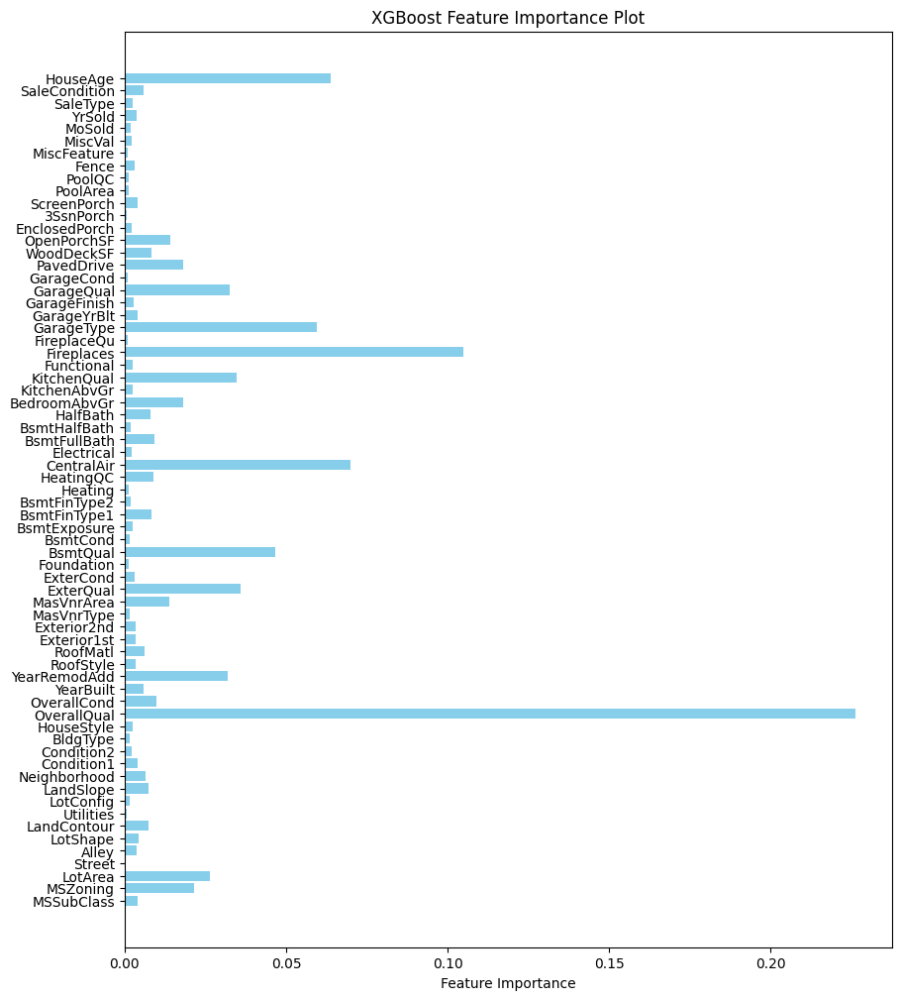

In [150]:
feature_importance = best_model.feature_importances_
feature_names = X_train.columns

plt.figure(figsize=(10, 12))
plt.barh(feature_names, feature_importance, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('XGBoost Feature Importance Plot')
plt.show()

In [151]:
feature_df = pd.DataFrame(feature_names, columns = ["Names"])
feature_df["Imp"]=feature_importance
feature_df.head()

,Names,Imp
0,MSSubClass,0.003947
1,MSZoning,0.021653
2,LotArea,0.026272
3,Street,0.000000
4,Alley,0.003624


## Test Data Prediction

In [152]:
df_test=pd.read_csv("test.csv")
id=df_test["Id"]
df_test.drop("Id",axis=1,inplace=True)
df_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [153]:
missing_values_columns_test=[feature for feature in df_test.columns if df_test[feature].isnull().sum()>0]
print(f"Number of Missing Columns : {len(missing_values_columns)}")

Number of Missing Columns : 19


In [154]:
def impute_nan(df,variable):
    random_sample=df[variable].dropna().sample(df[variable].isnull().sum(),random_state=0)
    random_sample.index=df[df[variable].isnull()].index
    df.loc[df[variable].isnull(),variable]=random_sample
for feature in missing_values_columns_test:
  if feature in categorical_features:
    if feature in missing_categorical_columns:
      df_test[feature]=df_test[feature].fillna("Missing")
    else:
      df_test[feature]=df_test[feature].fillna(df_test[feature].mode()[0])
  elif feature in numerical_features:
    df_test[feature]=df_test[feature].fillna(df_test[feature].median())
  else:
    impute_nan(df_test,feature)

In [155]:
df_test.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
Length: 79, dtype: int64

In [156]:
df_test.drop(multi_collinear_columns,inplace=True,axis=1)

In [157]:
df_test["HouseAge"]=df_test["YrSold"]-df_test["YearBuilt"]
skew_list.remove(target)
df_test[skew_list] = np.log1p(df_test[skew_list])

In [158]:
df_test[categorical_features]=ordinal_encoder.transform(df_test[categorical_features])
for feature in categorical_features:
  df_test[feature]=df_test[feature].astype(int)
df_test.head()

,MSSubClass,MSZoning,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,HouseAge
0,3.044522,2,9.360741,1,1,3,3,0,4,0,...,0.0,3,3,1,0.000000,6,2010,8,4,49
1,3.044522,3,9.565775,1,1,0,3,0,0,0,...,0.0,3,2,0,9.433564,6,2010,8,4,52
2,4.110874,3,9.534668,1,1,0,3,0,4,0,...,0.0,3,3,1,0.000000,3,2010,8,4,13
3,4.110874,3,9.208238,1,1,0,3,0,4,0,...,0.0,3,2,1,0.000000,6,2010,8,4,12
4,4.795791,3,8.518392,1,1,0,1,0,4,0,...,0.0,3,2,1,0.000000,1,2010,8,4,18


In [159]:
df_test[standard_scaler_features] = scaler.transform(df_test[standard_scaler_features])

In [160]:
predictions=np.expm1(best_model.predict(df_test))

In [161]:
submission = pd.DataFrame(id, columns = ['Id'])
submission['SalePrice'] = predictions
submission.to_csv("submission.csv", index = False, header = True)

In [162]:
submission.head()

,Id,SalePrice
0,1461,124590.6250
1,1462,161606.6250
2,1463,170365.5625
3,1464,193183.8750
4,1465,191059.2500
